In [1]:
from google.colab import drive

drive.mount('/gdrive')
%cd /gdrive/My Drive/[2024-2025] AN2DL/Homework 1

Mounted at /gdrive
/gdrive/My Drive/[2024-2025] AN2DL/Homework 1


In [2]:
# Set seed for reproducibility
seed = 42

# Import necessary libraries
import os

# Set environment variables before importing modules
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ['PYTHONHASHSEED'] = str(seed)
os.environ['MPLCONFIGDIR'] = os.getcwd() + '/configs/'

# Suppress warnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=Warning)

# Import necessary modules
import logging
import random
import numpy as np

# Set seeds for random number generators in NumPy and Python
np.random.seed(seed)
random.seed(seed)

# Import TensorFlow and Keras
import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl

# Set seed for TensorFlow
tf.random.set_seed(seed)
tf.compat.v1.set_random_seed(seed)

# Reduce TensorFlow verbosity
tf.autograph.set_verbosity(0)
tf.get_logger().setLevel(logging.ERROR)
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

# Print TensorFlow version
print(tf.__version__)

# Import other libraries
import requests
from io import BytesIO
import cv2
from PIL import Image
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import seaborn as sns

# Configure plot display settings
sns.set(font_scale=1.4)
sns.set_style('white')
plt.rc('font', size=14)
%matplotlib inline

2.17.0


In [ ]:
%cd /gdrive/My Drive/[2024-2025] AN2DL/Homework 1
%ls

/gdrive/.shortcut-targets-by-id/1JMiRhyfP5Aqdr8qBtb9CMaIkuwWd62CR/[2024-2025] AN2DL/Homework 1
'Homework 1 - Minimal Working Example.ipynb'   Logbook.gdoc   training_set.npz


In [3]:
def load_data():
    # Load dataset with TensorFlow Datasets, obtaining dataset info

    data = np.load('/gdrive/.shortcut-targets-by-id/1JMiRhyfP5Aqdr8qBtb9CMaIkuwWd62CR/[2024-2025] AN2DL/Homework 1/training_set.npz')
    train_dataset = data['images']
    test_dataset= data['labels']

    train_dataset = train_dataset[:11959]
    test_dataset = test_dataset[:11959]

    return (train_dataset,test_dataset)

# Execute function and load data
(X_test, y_test) = load_data()

print("Test set shape (images):", X_test.shape)
print("Test set shape (labels):", y_test.shape)

Test set shape (images): (11959, 96, 96, 3)
Test set shape (labels): (11959, 1)


In [8]:
import numpy as np

# Define a function to identify and remove outliers based on pixel intensity
def remove_outliers(images, labels, threshold=5):
    """
    Removes outliers based on pixel intensity distribution.

    Parameters:
    images (np.ndarray): The array of images, shape (num_samples, height, width, channels).
    labels (np.ndarray): The array of labels, shape (num_samples, 1).
    threshold (float): The z-score threshold to consider an image an outlier.

    Returns:
    np.ndarray, np.ndarray: Filtered images and labels without outliers.
    """
    # Compute the mean pixel intensity for each image
    mean_intensity = np.mean(images, axis=(1, 2, 3))

    # Calculate z-scores for the mean intensity
    z_scores = (mean_intensity - np.mean(mean_intensity)) / np.std(mean_intensity)

    # Identify non-outlier indices
    non_outlier_indices = np.where(np.abs(z_scores) < threshold)[0]

    # Filter images and labels based on non-outlier indices
    filtered_images = images[non_outlier_indices]
    filtered_labels = labels[non_outlier_indices]

    return filtered_images, filtered_labels

# Remove outliers from test set
X_test, y_test = remove_outliers(X_test, y_test, threshold=3)

# Display shapes after filtering
print("Filtered test set shape (images):", X_test.shape)
print("Filtered test set shape (labels):", y_test.shape)


Filtered test set shape (images): (11919, 96, 96, 3)
Filtered test set shape (labels): (11919, 1)


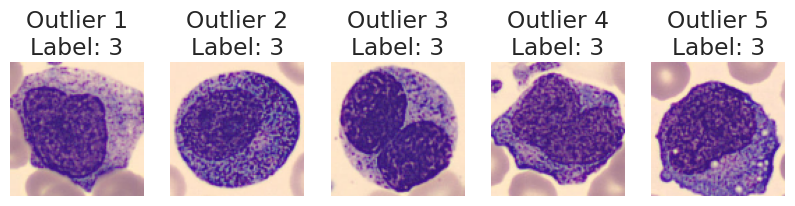

In [ ]:
import matplotlib.pyplot as plt

# Function to identify and display some outliers based on pixel intensity
def display_outliers(images, labels, threshold=5, num_outliers=5):
    """
    Displays a specified number of outlier images based on pixel intensity distribution.

    Parameters:
    images (np.ndarray): The array of images, shape (num_samples, height, width, channels).
    labels (np.ndarray): The array of labels, shape (num_samples, 1).
    threshold (float): The z-score threshold to consider an image an outlier.
    num_outliers (int): Number of outliers to display.
    """
    # Compute mean pixel intensity for each image
    mean_intensity = np.mean(images, axis=(1, 2, 3))

    # Calculate z-scores for the mean intensity
    z_scores = (mean_intensity - np.mean(mean_intensity)) / np.std(mean_intensity)

    # Identify outlier indices
    outlier_indices = np.where(np.abs(z_scores) >= threshold)[0]

    # Limit to specified number of outliers
    if len(outlier_indices) > num_outliers:
        outlier_indices = outlier_indices[:num_outliers]

    # Display outliers
    plt.figure(figsize=(10, 10))
    for i, idx in enumerate(outlier_indices):
        plt.subplot(1, num_outliers, i + 1)
        plt.imshow(images[idx])
        plt.title(f"Outlier {i+1}\nLabel: {labels[idx][0]}")
        plt.axis('off')
    plt.show()

# Display some outliers
display_outliers(x_test, y_test, threshold=3, num_outliers=5)


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
373/373 ━━━━━━━━━━━━━━━━━━━━ 452s 1s/step


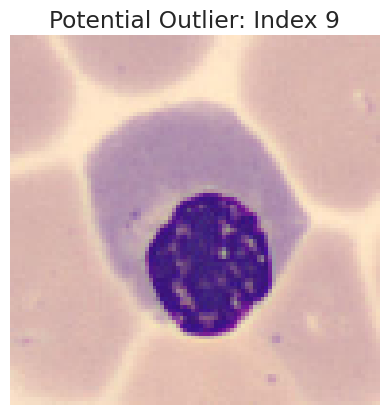

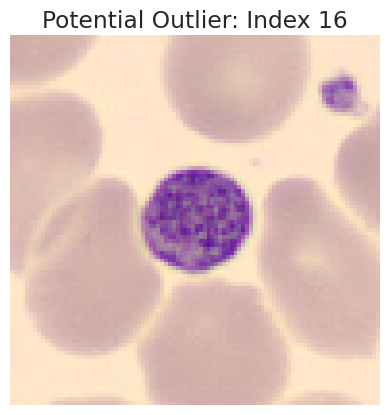

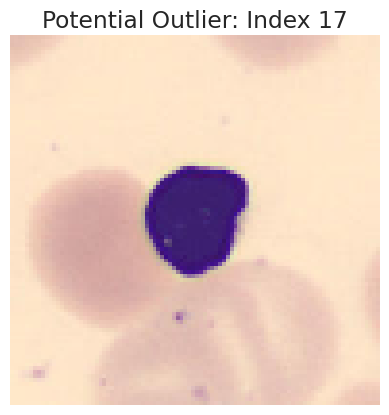

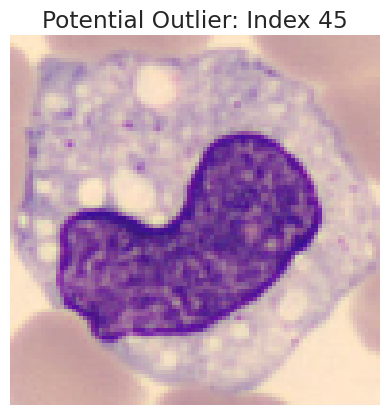

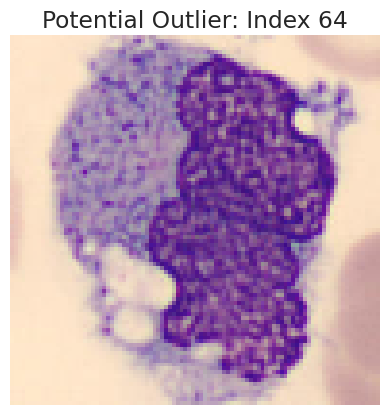

...

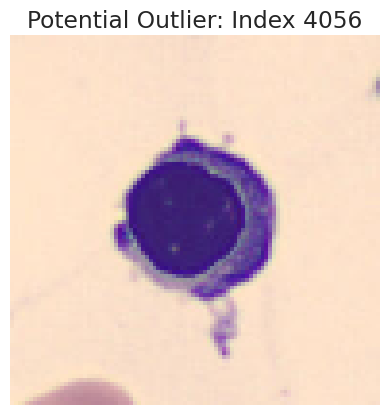

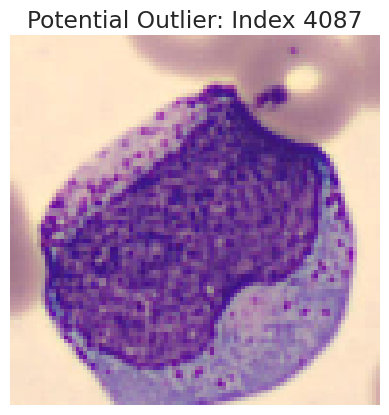

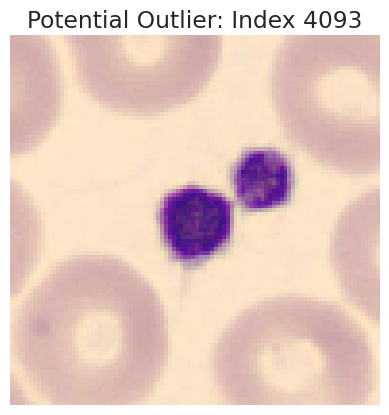

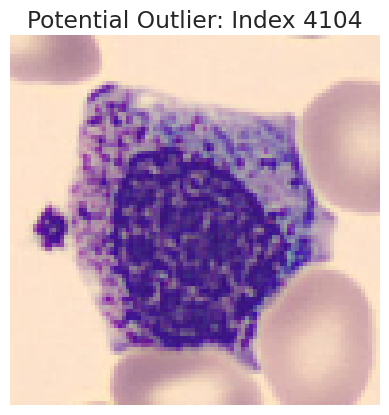

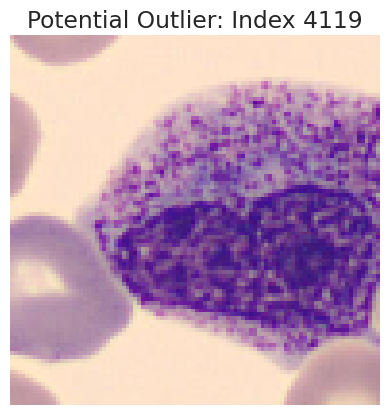

KeyboardInterrupt: 

In [ ]:
import numpy as np
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.models import Model
from sklearn.metrics.pairwise import cosine_similarity

# Load the pretrained model for feature extraction
base_model = MobileNetV2(weights='imagenet', include_top=False, pooling='avg')
model = Model(inputs=base_model.input, outputs=base_model.output)

# Function to extract features
def extract_features(images):
    images = preprocess_input(images)  # Preprocess images for MobileNetV2
    features = model.predict(images)
    return features

# Example usage
# Assuming `x_test` is the image data for a specific class
features = extract_features(x_test)

# Calculate pairwise cosine similarity for features within the class
similarity_matrix = cosine_similarity(features)

# Identify potential outliers based on similarity scores
threshold = 0.5  # Adjust based on inspection of results
outliers = []
for i in range(len(similarity_matrix)):
    # Average similarity with other images in the class
    avg_similarity = np.mean(similarity_matrix[i][similarity_matrix[i] < 1.0])
    if avg_similarity < threshold:
        outliers.append(i)

# Display or discard images with low similarity
for idx in outliers:
    plt.imshow(x_test[idx])
    plt.title(f"Potential Outlier: Index {idx}")
    plt.axis('off')
    plt.show()


Duplicate found with different labels: [(119, 6), (4740, 3)]


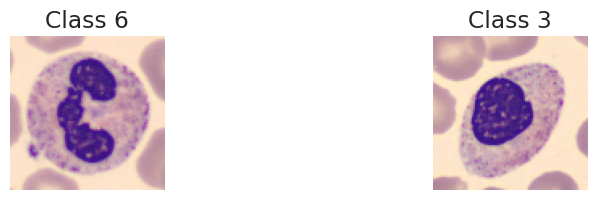

Duplicate found with different labels: [(807, 1), (10985, 4)]


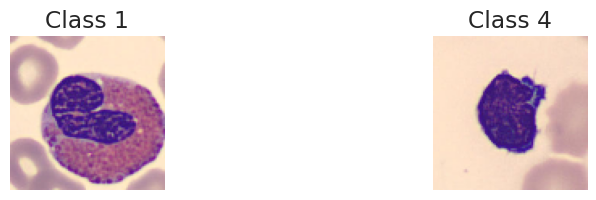

Duplicate found with different labels: [(1069, 3), (3427, 4)]


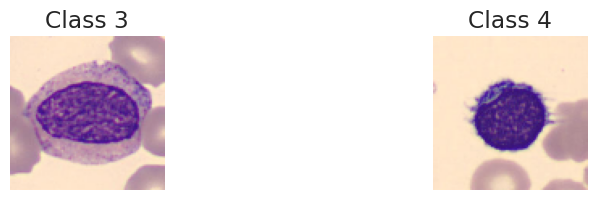

Duplicate found with different labels: [(3040, 3), (11524, 1)]


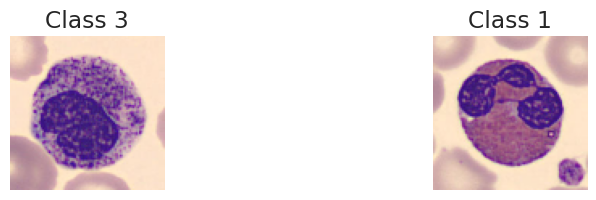

Duplicate found with different labels: [(3316, 2), (11533, 0)]


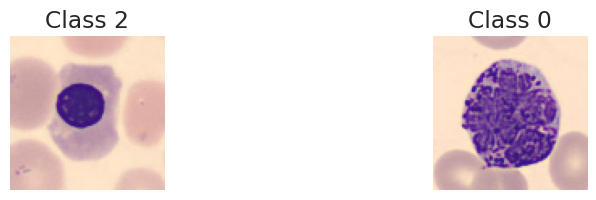

Duplicate found with different labels: [(5444, 1), (11812, 5)]


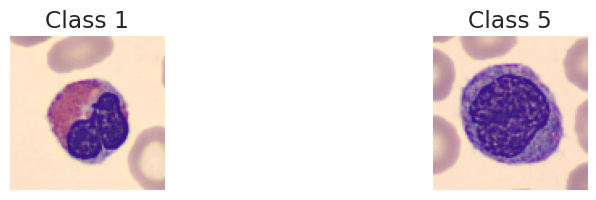

Duplicate found with different labels: [(8088, 7), (9047, 2)]


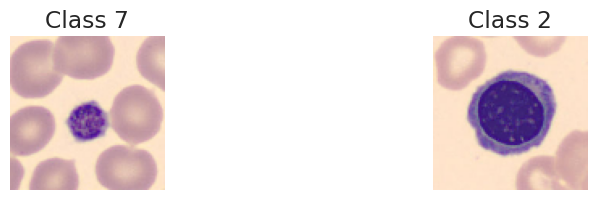

In [ ]:
import hashlib
from collections import defaultdict

def compute_image_hash(image):
    """Computes a unique hash for an image based on its pixel values."""
    return hashlib.md5(image.tobytes()).hexdigest()

def find_duplicates_across_classes(images, labels):
    """
    Finds duplicate images across different classes.

    Parameters:
    images (np.ndarray): Array of images.
    labels (np.ndarray): Array of labels.

    Returns:
    dict: Duplicates across classes with their labels and indices.
    """
    hash_dict = defaultdict(list)
    duplicates = {}

    for idx, (image, label) in enumerate(zip(images, labels)):
        image_hash = compute_image_hash(image)
        hash_dict[image_hash].append((idx, label[0]))  # Store index and label

    # Find duplicates across different classes
    for image_hash, entries in hash_dict.items():
        unique_labels = {entry[1] for entry in entries}
        if len(unique_labels) > 1:  # Duplicate image with different labels
            duplicates[image_hash] = entries

    return duplicates


# Find duplicates across classes
duplicates = find_duplicates_across_classes(X_test, y_test)

# Display duplicates found across classes
for image_hash, entries in duplicates.items():
    print(f"Duplicate found with different labels: {entries}")
    plt.figure(figsize=(10, 2))
    for idx, (img_index, label) in enumerate(entries):
        plt.subplot(1, len(entries), idx + 1)
        plt.imshow(x_test[img_index])
        plt.title(f"Class {label}")
        plt.axis('off')
    plt.show()


In [ ]:
'''
import numpy as np
import matplotlib.pyplot as plt
import random

# Load data (assuming X and y have already been loaded from training_set.npz)
X = data['images'], y = data['labels']

# Ensure labels are integers
if len(y.shape) > 1 and y.shape[1] > 1:
    # Convert one-hot encoded labels to integer class indices
    y = np.argmax(y, axis=1)

# Define class names for 8 classes
class_names = ["Class_1", "Class_2", "Class_3", "Class_4", "Class_5", "Class_6", "Class_7", "Class_8"]

# Number of images to display
num_img = 10

# Select random indices from the dataset
random_indices = random.sample(range(len(X)), num_img)

# Create subplot layout for images
fig, axes = plt.subplots(2, num_img // 2, figsize=(20, 9))

for i, idx in enumerate(random_indices):
    ax = axes[i // (num_img // 2), i % (num_img // 2)]

    # Display the image at the selected index
    ax.imshow(X[idx])

    # Add class name as title
    class_name = class_names[int(y[idx])]
    ax.set_title(class_name, pad=5)

    # Remove axis lines for clearer display
    ax.axis('off')

# Adjust layout for better spacing
plt.tight_layout()
plt.show()

'''

'\nimport numpy as np\nimport matplotlib.pyplot as plt\nimport random\n\n# Load data (assuming X and y have already been loaded from training_set.npz)\nX = data[\'images\'], y = data[\'labels\']\n\n# Ensure labels are integers\nif len(y.shape) > 1 and y.shape[1] > 1:\n    # Convert one-hot encoded labels to integer class indices\n    y = np.argmax(y, axis=1)\n\n# Define class names for 8 classes\nclass_names = ["Class_1", "Class_2", "Class_3", "Class_4", "Class_5", "Class_6", "Class_7", "Class_8"]\n\n# Number of images to display\nnum_img = 10\n\n# Select random indices from the dataset\nrandom_indices = random.sample(range(len(X)), num_img)\n\n# Create subplot layout for images\nfig, axes = plt.subplots(2, num_img // 2, figsize=(20, 9))\n\nfor i, idx in enumerate(random_indices):\n    ax = axes[i // (num_img // 2), i % (num_img // 2)]\n\n    # Display the image at the selected index\n    ax.imshow(X[idx])\n\n    # Add class name as title\n    class_name = class_names[int(y[idx])]\n   

In [ ]:
'''
def plot_class_distribution(y_train, y_test, class_names):
    # Set seaborn style for the plot
    sns.set_style("whitegrid")
    plt.figure(figsize=(18, 6))

    # Calculate class distributions for training and test sets
    train_dist = np.bincount(y_train)
    test_dist = np.bincount(y_test)

    # Create x positions and set bar width
    x = np.arange(len(class_names))
    width = 0.35

    # Plot bars for training and test distributions
    plt.bar(x - width / 2, train_dist, width, label='Training', color='#2ecc71', alpha=0.7)
    plt.bar(x + width / 2, test_dist, width, label='Test', color='#3498db', alpha=0.7)

    # Customise plot title and labels
    plt.title('Class Distribution', pad=20, fontsize=14)
    plt.xlabel('Classes')
    plt.ylabel('Number of Images')

    # Set class names as x-axis labels with rotation
    plt.xticks(x, class_names, rotation=45, ha='right')

    # Add legend for training and test distributions
    plt.legend(loc='lower right')

    # Adjust layout for optimal spacing
    plt.tight_layout()
    plt.show()

# Execute function to plot class distribution
plot_class_distribution(y_train, y_test, class_names)

'''

'\ndef plot_class_distribution(y_train, y_test, class_names):\n    # Set seaborn style for the plot\n    sns.set_style("whitegrid")\n    plt.figure(figsize=(18, 6))\n\n    # Calculate class distributions for training and test sets\n    train_dist = np.bincount(y_train)\n    test_dist = np.bincount(y_test)\n\n    # Create x positions and set bar width\n    x = np.arange(len(class_names))\n    width = 0.35\n\n    # Plot bars for training and test distributions\n    plt.bar(x - width / 2, train_dist, width, label=\'Training\', color=\'#2ecc71\', alpha=0.7)\n    plt.bar(x + width / 2, test_dist, width, label=\'Test\', color=\'#3498db\', alpha=0.7)\n\n    # Customise plot title and labels\n    plt.title(\'Class Distribution\', pad=20, fontsize=14)\n    plt.xlabel(\'Classes\')\n    plt.ylabel(\'Number of Images\')\n\n    # Set class names as x-axis labels with rotation\n    plt.xticks(x, class_names, rotation=45, ha=\'right\')\n\n    # Add legend for training and test distributions\n    plt.

In [ ]:
'''
# Split test set into validation and test sets with stratification
X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, random_state=seed, test_size=0.5, stratify=y_test)
class_names = ["Class_1", "Class_2", "Class_3", "Class_4", "Class_5", "Class_6", "Class_7", "Class_8"]

# Convert class labels to categorical format for training, validation, and test sets
y_train = tfk.utils.to_categorical(y_train, num_classes=len(class_names))
y_val = tfk.utils.to_categorical(y_val, num_classes=len(class_names))
y_test = tfk.utils.to_categorical(y_test, num_classes=len(class_names))

# Print shapes of the datasets
print(f"X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")
print(f"X_val shape: {X_val.shape}, y_val shape: {y_val.shape}")
print(f"X_test shape: {X_test.shape}, y_test shape: {y_test.shape}")

'''

'\n# Split test set into validation and test sets with stratification\nX_val, X_test, y_val, y_test = train_test_split(X_test, y_test, random_state=seed, test_size=0.5, stratify=y_test)\nclass_names = ["Class_1", "Class_2", "Class_3", "Class_4", "Class_5", "Class_6", "Class_7", "Class_8"]\n\n# Convert class labels to categorical format for training, validation, and test sets\ny_train = tfk.utils.to_categorical(y_train, num_classes=len(class_names))\ny_val = tfk.utils.to_categorical(y_val, num_classes=len(class_names))\ny_test = tfk.utils.to_categorical(y_test, num_classes=len(class_names))\n\n# Print shapes of the datasets\nprint(f"X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")\nprint(f"X_val shape: {X_val.shape}, y_val shape: {y_val.shape}")\nprint(f"X_test shape: {X_test.shape}, y_test shape: {y_test.shape}")\n\n'

In [9]:
# Initial split to create a train set and a temporary set (val + test)
X_train, X_temp, y_train, y_temp = train_test_split(
    X_test, y_test, random_state=seed, test_size=0.3, stratify=y_test
)

# Further split the temporary set into validation and test sets
X_val, X_test_final, y_val, y_test_final = train_test_split(
    X_temp, y_temp, random_state=seed, test_size=0.5, stratify=y_temp
)

# Define the number of classes for one-hot encoding
num_classes = 8
y_train = tf.keras.utils.to_categorical(y_train, num_classes=num_classes)
y_val = tf.keras.utils.to_categorical(y_val, num_classes=num_classes)
y_test_final = tf.keras.utils.to_categorical(y_test_final, num_classes=num_classes)

# Print shapes of X and y for each split
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)       # Expected shape: (training size, 8)
print("X_val shape:", X_val.shape)
print("y_val shape:", y_val.shape)           # Expected shape: (validation size, 8)
print("X_test_final shape:", X_test_final.shape)
print("y_test_final shape:", y_test_final.shape)  # Expected shape: (test size, 8)

X_train shape: (8343, 96, 96, 3)
y_train shape: (8343, 8)
X_val shape: (1788, 96, 96, 3)
y_val shape: (1788, 8)
X_test_final shape: (1788, 96, 96, 3)
y_test_final shape: (1788, 8)


52606240/52606240 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "efficientnetv2-b3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 96, 96, 3)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling (Rescaling)     │ (None, 96, 96, 3)      │              0 │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ normalization             │ (None, 96, 96, 3)      │              0 │ rescaling[0][0]        │
│ (Normalization)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv (Conv2D)        │ (None, 48, 48, 40)     │          1,080 │ normalization[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_bn                   │ (None, 48, 48, 40)     │            160 │ stem_conv[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_activation           │ (None, 48, 48, 40)     │              0 │ stem_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_project_conv      │ (None, 48, 48, 16)     │          5,760 │ stem_activation[0][0]  │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_project_bn        │ (None, 48, 48, 16)     │             64 │ block1a_project_conv[… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_project_activati… │ (None, 48, 48, 16)     │              0 │ block1a_project_bn[0]… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1b_project_conv      │ (None, 48, 48, 16)     │          2,304 │ block1a_project_activ… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1b_project_bn        │ (None, 48, 48, 16)     │             64 │ block1b_project_conv[… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1b_project_activati… │ (None, 48, 48, 16)     │              0 │ block1b_project_bn[0]… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1b_drop (Dropout)    │ (None, 48, 48, 16)     │              0 │ block1b_project_activ… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1b_add (Add)         │ (None, 48, 48, 16)     │              0 │ block1b_drop[0][0],    │
│                           │                        │                │ block1a_project_activ… │
├──────────────────────

 Total params: 12,930,622 (49.33 MB)

 Trainable params: 12,821,406 (48.91 MB)

 Non-trainable params: 109,216 (426.62 KB)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.687098 to fit



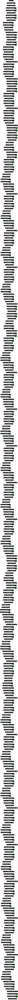

In [10]:
# Initialise MobileNetV3Small model with pretrained weights, for transfer learning
mobilenet = tf.keras.applications.EfficientNetV2B3(
    include_top=False,
    input_shape=(96, 96, 3),
    weights="imagenet",
    input_tensor=None,
    pooling=False,
    classes=8,
    classifier_activation="softmax",
    include_preprocessing=True,
    name="efficientnetv2-b3",
)


# Display a summary of the model architecture
mobilenet.summary(expand_nested=True)

# Display model architecture with layer shapes and trainable parameters
# Specify 'to_file' argument with a path where you have write permissions
tfk.utils.plot_model(mobilenet, to_file='/tmp/model.png', expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)
#  In Google Colab, '/tmp/' is a directory where you have write permissions.
# Or, if you want to save it to your Google Drive, mount your drive and specify a path within your drive.

In [11]:
import tensorflow.keras as keras

keras.mixed_precision.set_global_policy("mixed_float16")

In [14]:
from keras import regularizers
# Freeze all layers in MobileNetV3Small to use it solely as a feature extractor
mobilenet.trainable = False

# Define input layer with shape matching the input images
inputs = tfk.Input(shape=(96, 96, 3), name='input_layer')

# Apply data augmentation for training robustness
augmentation = tf.keras.Sequential([
    tfkl.RandomCrop(height=96, width=96),  # adjust height and width as per your input
    tfkl.RandomFlip("horizontal"),
    tfkl.RandomTranslation(0.2, 0.2),
    tfkl.RandomRotation(0.7),
    tfkl.RandomZoom(0.2),
    tfkl.RandomContrast(0.2),
    tfkl.RandomBrightness(0.6),
], name='preprocessing')

# Apply the augmentation pipeline
x = augmentation(inputs)


# Pass augmented inputs through the MobileNetV3Small feature extractor
x = mobilenet(x)
# Add a dropout layer for regularisation

x = tfkl.GlobalAveragePooling2D(name='avg_pool')(x)

# Add a batch normalization layer
x = tfkl.BatchNormalization(name='batch_norm')(x)

# Add a dropout layer for regularization
x = tfkl.Dropout(0.4, name='dropout')(x)

# Add a dense layer with 256 units and GELU activation
x = tfkl.Dense(256, activation='gelu', name='dense1',kernel_regularizer=regularizers.L1L2(l1=1e-5, l2=1e-4),
    bias_regularizer=regularizers.L2(1e-4),
    activity_regularizer=regularizers.L2(1e-5))(x)

# Add layer normalization
x = tfkl.LayerNormalization(name='layer_norm1')(x)

# Add another dropout layer
x = tfkl.Dropout(0.4, name='dropout2')(x)

# Add a second dense layer with 128 units and GELU activation
x = tfkl.Dense(128, activation='gelu', name='dense2',kernel_regularizer=regularizers.L1L2(l1=1e-5, l2=1e-4),
    bias_regularizer=regularizers.L2(1e-4),
    activity_regularizer=regularizers.L2(1e-5))(x)

# Add layer normalization
x = tfkl.LayerNormalization(name='layer_norm2')(x)

# Add another dropout layer
x = tfkl.Dropout(0.3, name='dropout3')(x)
# Add final Dense layer for classification with softmax activation
outputs = tfkl.Dense(8, activation='softmax', name='output')(x)

# Define the complete model linking input and output
tl_model = tfk.Model(inputs=inputs, outputs=outputs, name='model')

# Compile the model with categorical cross-entropy loss and Adam optimiser
tl_model.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.Adam(), metrics=['accuracy'])

# Display a summary of the model architecture
tl_model.summary(expand_nested=True)

# Display model architecture with layer shapes and trainable parameters
#tfk.utils.plot_model(tl_model, to_file='/tmp/model.png', expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)


Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ preprocessing (Sequential)           │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_crop_1 (RandomCrop)      │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_flip_1 (RandomFlip)      │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_translation_1            │ (None, 96, 96, 3)           │               0 │
│ (RandomTranslation)                  │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_rotation_1               │ (None, 96, 96, 3)           │               0 │
│ (RandomRotation)                     │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_zoom_1 (RandomZoom)      │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_contrast_1               │ (None, 96, 96, 3)           │               0 │
│ (RandomContrast)                     │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_brightness_1             │ (None, 96, 96, 3)           │               0 │
│ (RandomBrightness)                   │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetv2-b3 (Functional)       │ (None, 3, 3, 1536)          │      12,930,622 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ input_layer_2 (InputLayer)      │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ rescaling (Rescaling)           │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ normalization (Normalization)   │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ stem_conv (Conv2D)              │ (None, 48, 48, 40)          │           1,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ stem_bn (BatchNormalization)    │ (None, 48, 48, 40)          │             160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ stem_activation (Activation)    │ (None, 48, 48, 40)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_project_conv (Conv2D)   │ (None, 48, 48, 16)          │           5,760 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_project_bn              │ (None, 48, 48, 16)          │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_project_activation      │ (None, 48, 48, 16)          │              

 Total params: 13,364,934 (50.98 MB)

 Trainable params: 431,240 (1.65 MB)

 Non-trainable params: 12,933,694 (49.34 MB)

In [15]:
from tqdm.keras import TqdmCallback
from sklearn.metrics import accuracy_score, classification_report

# Train the model
tl_history = tl_model.fit(
    x=X_train ,
    y=y_train,
    batch_size=64,
    epochs=20,
    validation_data=(X_val , y_val),
    callbacks=[tfk.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=20,
                                           restore_best_weights=True)]
).history

# Calculate and print the best validation accuracy achieved
final_val_accuracy = round(max(tl_history['val_accuracy']) * 100, 2)
print(f'Final validation accuracy: {final_val_accuracy}%')


# Generate predictions on the test set and print a classification report
y_pred = tl_model.predict(X_test_final)
y_pred_classes = y_pred.argmax(axis=1)  # Convert probabilities to class labels
y_test_classes = y_test_final.argmax(axis=1)

# Print classification report
print("Classification Report:")
print(classification_report(y_test_classes, y_pred_classes))


# Save the trained model to a file, including final accuracy in the filename
model_filename = '/tmp/Blood_Cells_MobileNetV3S_' + str(final_val_accuracy) + '.keras'
tl_model.save(model_filename)


# Free memory by deleting the model instance
del tl_model

Epoch 1/20
 67/131 ━━━━━━━━━━━━━━━━━━━━ 1:49 2s/step - accuracy: 0.2759 - loss: 2.8987

KeyboardInterrupt: 

In [ ]:
# Re-load the model after transfer learning
ft_model = tfk.models.load_model('/tmp/Blood_Cells_MobileNetV3S_88.18.keras')

# Display a summary of the model architecture
ft_model.summary(expand_nested=True)

# Display model architecture with layer shapes and trainable parameters
#tfk.utils.plot_model(ft_model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ preprocessing (Sequential)           │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_crop_1 (RandomCrop)      │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_flip_1 (RandomFlip)      │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_translation_1            │ (None, 96, 96, 3)           │               0 │
│ (RandomTranslation)                  │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_rotation_1               │ (None, 96, 96, 3)           │               0 │
│ (RandomRotation)                     │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_zoom_1 (RandomZoom)      │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_contrast_1               │ (None, 96, 96, 3)           │               0 │
│ (RandomContrast)                     │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_brightness_1             │ (None, 96, 96, 3)           │               0 │
│ (RandomBrightness)                   │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetv2-b3 (Functional)       │ (None, 3, 3, 1536)          │      12,930,622 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ input_layer_2 (InputLayer)      │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ rescaling_1 (Rescaling)         │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ normalization_1 (Normalization) │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ stem_conv (Conv2D)              │ (None, 48, 48, 40)          │           1,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ stem_bn (BatchNormalization)    │ (None, 48, 48, 40)          │             160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ stem_activation (Activation)    │ (None, 48, 48, 40)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_project_conv (Conv2D)   │ (None, 48, 48, 16)          │           5,760 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_project_bn              │ (None, 48, 48, 16)          │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_project_activation      │ (None, 48, 48, 16)          │              

 Total params: 14,227,416 (54.27 MB)

 Trainable params: 431,240 (1.65 MB)

 Non-trainable params: 12,933,694 (49.34 MB)

 Optimizer params: 862,482 (3.29 MB)

In [ ]:
# Set the MobileNetV3Small model layers as trainable
ft_model.get_layer('efficientnetv2-b3').trainable = True

# Set all MobileNetV3Small layers as non-trainable
for layer in ft_model.get_layer('efficientnetv2-b3').layers:
    layer.trainable = False

# Enable training only for Conv2D and DepthwiseConv2D layers
for i, layer in enumerate(ft_model.get_layer('efficientnetv2-b3').layers):
    if isinstance(layer, tf.keras.layers.Conv2D) or isinstance(layer, tf.keras.layers.DepthwiseConv2D):
        layer.trainable = True
        print(i, layer.name, type(layer).__name__, layer.trainable)

3 stem_conv Conv2D True
6 block1a_project_conv Conv2D True
9 block1b_project_conv Conv2D True
14 block2a_expand_conv Conv2D True
17 block2a_project_conv Conv2D True
19 block2b_expand_conv Conv2D True
22 block2b_project_conv Conv2D True
26 block2c_expand_conv Conv2D True
29 block2c_project_conv Conv2D True
33 block3a_expand_conv Conv2D True
36 block3a_project_conv Conv2D True
38 block3b_expand_conv Conv2D True
41 block3b_project_conv Conv2D True
45 block3c_expand_conv Conv2D True
48 block3c_project_conv Conv2D True
52 block4a_expand_conv Conv2D True
55 block4a_dwconv2 DepthwiseConv2D True
60 block4a_se_reduce Conv2D True
61 block4a_se_expand Conv2D True
63 block4a_project_conv Conv2D True
65 block4b_expand_conv Conv2D True
68 block4b_dwconv2 DepthwiseConv2D True
73 block4b_se_reduce Conv2D True
74 block4b_se_expand Conv2D True
76 block4b_project_conv Conv2D True
80 block4c_expand_conv Conv2D True
83 block4c_dwconv2 DepthwiseConv2D True
88 block4c_se_reduce Conv2D True
89 block4c_se_expa

In [ ]:
# Set the number of layers to freeze
N = 124

# Set the first N layers as non-trainable
for i, layer in enumerate(ft_model.get_layer('efficientnetv2-b3').layers[:N]):
    layer.trainable = False

# Print layer indices, names, and trainability status
for i, layer in enumerate(ft_model.get_layer('efficientnetv2-b3').layers):
    print(i, layer.name, layer.trainable)

# Display a summary of the model architecture
ft_model.summary(expand_nested=True)

# Display model architecture with layer shapes and trainable parameters
#tfk.utils.plot_model(ft_model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

0 input_layer_2 False
1 rescaling_1 False
2 normalization_1 False
3 stem_conv False
4 stem_bn False
5 stem_activation False
6 block1a_project_conv False
7 block1a_project_bn False
8 block1a_project_activation False
9 block1b_project_conv False
10 block1b_project_bn False
11 block1b_project_activation False
12 block1b_drop False
13 block1b_add False
14 block2a_expand_conv False
15 block2a_expand_bn False
16 block2a_expand_activation False
17 block2a_project_conv False
18 block2a_project_bn False
19 block2b_expand_conv False
20 block2b_expand_bn False
21 block2b_expand_activation False
22 block2b_project_conv False
23 block2b_project_bn False
24 block2b_drop False
25 block2b_add False
26 block2c_expand_conv False
27 block2c_expand_bn False
28 block2c_expand_activation False
29 block2c_project_conv False
30 block2c_project_bn False
31 block2c_drop False
32 block2c_add False
33 block3a_expand_conv False
34 block3a_expand_bn False
35 block3a_expand_activation False
36 block3a_project_conv F

Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ preprocessing (Sequential)           │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_crop_1 (RandomCrop)      │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_flip_1 (RandomFlip)      │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_translation_1            │ (None, 96, 96, 3)           │               0 │
│ (RandomTranslation)                  │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_rotation_1               │ (None, 96, 96, 3)           │               0 │
│ (RandomRotation)                     │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_zoom_1 (RandomZoom)      │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_contrast_1               │ (None, 96, 96, 3)           │               0 │
│ (RandomContrast)                     │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_brightness_1             │ (None, 96, 96, 3)           │               0 │
│ (RandomBrightness)                   │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetv2-b3 (Functional)       │ (None, 3, 3, 1536)          │      12,930,622 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ input_layer_2 (InputLayer)      │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ rescaling_1 (Rescaling)         │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ normalization_1 (Normalization) │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ stem_conv (Conv2D)              │ (None, 48, 48, 40)          │           1,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ stem_bn (BatchNormalization)    │ (None, 48, 48, 40)          │             160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ stem_activation (Activation)    │ (None, 48, 48, 40)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_project_conv (Conv2D)   │ (None, 48, 48, 16)          │           5,760 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_project_bn              │ (None, 48, 48, 16)          │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_project_activation      │ (None, 48, 48, 16)          │              

 Total params: 14,227,416 (54.27 MB)

 Trainable params: 12,111,120 (46.20 MB)

 Non-trainable params: 1,253,814 (4.78 MB)

 Optimizer params: 862,482 (3.29 MB)

In [ ]:
# Compile the model
ft_model.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.Adam(1e-4), metrics=['accuracy'])

In [ ]:
# Fine-tune the model
ft_history = ft_model.fit(
    x = X_train,
    y = y_train,
    batch_size = 32,
    epochs = 5,
    validation_data = (X_test_final, y_test_final),
    callbacks = [tfk.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=20, restore_best_weights=True)]
).history

# Calculate and print the final validation accuracy
final_val_accuracy = round(max(ft_history['val_accuracy'])* 100, 2)
print(f'Final validation accuracy: {final_val_accuracy}%')

# Save the trained model to a file with the accuracy included in the filename
model_filename = '/tmp/Blood_Cells_MobileNetV3S_'+str(final_val_accuracy)+'.keras'
ft_model.save(model_filename)

# Delete the model to free up resources
del ft_model

Epoch 1/5
262/262 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - accuracy: 0.9407 - loss: 0.1917 - val_accuracy: 0.9615 - val_loss: 0.1097
Epoch 2/5
262/262 ━━━━━━━━━━━━━━━━━━━━ 42s 90ms/step - accuracy: 0.9432 - loss: 0.1807 - val_accuracy: 0.9744 - val_loss: 0.0837
Epoch 3/5
262/262 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - accuracy: 0.9459 - loss: 0.1613 - val_accuracy: 0.9688 - val_loss: 0.0948
Epoch 4/5
262/262 ━━━━━━━━━━━━━━━━━━━━ 41s 81ms/step - accuracy: 0.9452 - loss: 0.1726 - val_accuracy: 0.9660 - val_loss: 0.1010
Epoch 5/5
262/262 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - accuracy: 0.9537 - loss: 0.1452 - val_accuracy: 0.9749 - val_loss: 0.0853
Final validation accuracy: 97.49%


In [ ]:
# file: /tmp/model.py
class Model:
    def __init__(self):
        """Initialize the internal state of the model."""

    def predict(self, X):
        """Return a numpy array with the labels corresponding to the input X."""

In [ ]:
%%writefile /tmp/model.py
import numpy as np

import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl
class Model:
    def __init__(self):
        """
        Initialize the internal state of the model. Note that the __init__
        method cannot accept any arguments.

        The following is an example loading the weights of a pre-trained
        model.
        """
        self.neural_network = tfk.models.load_model('Blood_Cells_MobileNetV3S_97.49.keras')

    def predict(self, X):
        """
        Predict the labels corresponding to the input X. Note that X is a numpy
        array of shape (n_samples, 96, 96, 3) and the output should be a numpy
        array of shape (n_samples,). Therefore, outputs must no be one-hot
        encoded.

        The following is an example of a prediction from the pre-trained model
        loaded in the __init__ method.
        """
        preds = self.neural_network.predict(X)
        if len(preds.shape) == 2:
            preds = np.argmax(preds, axis=1)
        return preds

Overwriting /tmp/model.py


In [ ]:
from datetime import datetime
filename = f'/tmp/submission_{datetime.now().strftime("%y%m%d_%H%M%S")}.zip'

# Add files to the zip command if needed
# The original path was incorrect. Using f-string to format correctly.
!zip {filename} /tmp/model.py /tmp/Blood_Cells_MobileNetV3S_97.49.keras

from google.colab import files
files.download(filename)

  adding: tmp/model.py (deflated 54%)
  adding: tmp/Blood_Cells_MobileNetV3S_97.49.keras (deflated 8%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>